# **Step2_AI 강사 Agent v2.0**

## **0. 미션**

### **미션③ : 모듈 고도화1**
다음 항목에 대해서 조 상황에 맞게 선택적으로 고도화 합니다.

* 입력 프롬프트 추가 : 강의 목소리, 톤 조절, 강의 스타일 지침
* 정보 분해 : 여러 슬라이드를 저장하고 관리하기 위한 폴더 준비, 불필요한 정보 제거, 제목 추출
* 페이지별 내용 생성 : 슬라이드 내 정보 뿐만 아니라 부연 설명을 위한 검색 기능 추가
* 강의 스크립트 생성 : 전체 강의 내용을 참조하여 강의 흐름을 구상하고,
                                   현재 페이지 강의 스크립트 작성
* 내용 검토 : 페이지 내용과 강의 스크립트 비교, 강의 스크립트 흐름 적절한지 검토




### **미션④ : AI 강사 Agent 완성**
* 모듈 고도화2(다음 항목에 대해서 조 상황에 맞게 선택적으로 고도화 합니다.)
    * 음성 변환 : 강의 목소리, 톤 조절 음성 변환
    * 영상 제작 :
        * 각 페이지 : 음성과 슬라이드 스냅샷 이미지 합성하여 영상 제작하기
        * 전체 강의 영상 : 각 슬라이드 강의를 전체 슬라이드 강의 영상으로 합치기
* 웹 화면 연결(gradio)
    * 음성 변환 : 강의 목소리, 톤 조절 프롬프트 기반 음성 변환
* 전체 Agent 그래프 구축
    * 전체를 Agent 그래프로 엮기


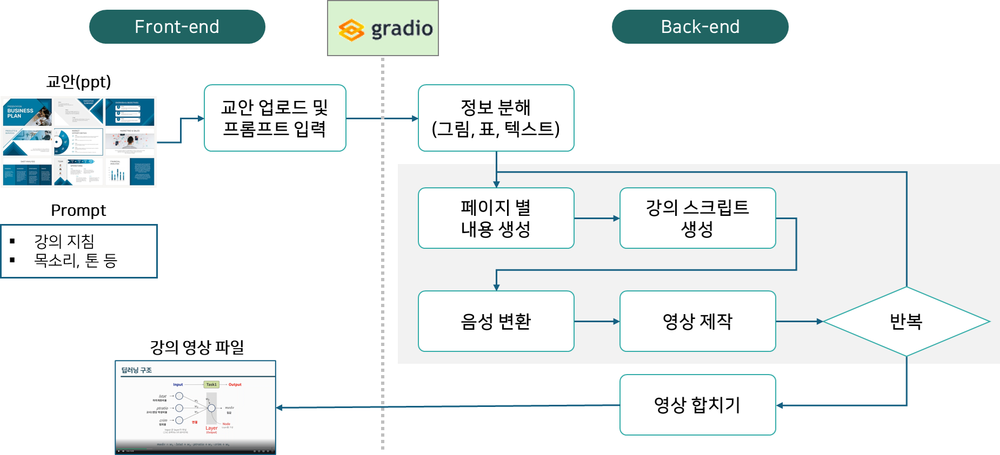

## **1. 환경준비**

### (1) 구글 드라이브

* 구글 드라이브 폴더 생성
    * 새 폴더 `proj1_agent`를 생성하고
    * 제공 받은 파일을 업로드

* 구글 드라이브 연결

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### (2) 한글 폰트 준비
* 한글 폰트 설치 및 설정 코드
* 영상 제작 등 한글 사용시 필요

In [5]:
%%bash
set -e

# (1) 필수 패키지
sudo apt-get update -y
sudo apt-get install -y \
  libreoffice poppler-utils poppler-data ffmpeg locales fontconfig xvfb \
  fonts-noto-core fonts-noto-cjk fonts-noto-cjk-extra

# (2) 로케일
sudo sed -i 's/^# *ko_KR.UTF-8 UTF-8/ko_KR.UTF-8 UTF-8/' /etc/locale.gen
sudo locale-gen ko_KR.UTF-8
sudo update-locale LANG=ko_KR.UTF-8

# (3) 기존에 만들었던 사용자 fonts.conf(전체 덮어쓰기) 제거
rm -f ~/.config/fontconfig/fonts.conf || true

# (4) 시스템 fontconfig에 로컬 룰로만 추가 (기본 설정은 그대로 사용)
sudo tee /etc/fonts/local.conf >/dev/null <<'EOF'
<?xml version="1.0"?>
<!DOCTYPE fontconfig SYSTEM "fonts.dtd">
<fontconfig>

  <!-- 한국어는 Noto Sans KR 우선 -->
  <match target="pattern">
    <test name="lang" compare="contains"><string>ko</string></test>
    <edit name="family" mode="prepend" binding="strong">
      <string>Noto Sans KR</string>
      <string>Noto Sans CJK KR</string>
      <string>Noto Sans</string>
    </edit>
  </match>

  <!-- 흔한 한글 폰트명을 Noto Sans KR로 매핑 -->
  <alias><family>Malgun Gothic</family><prefer><family>Noto Sans KR</family></prefer></alias>
  <alias><family>맑은 고딕</family><prefer><family>Noto Sans KR</family></prefer></alias>
  <alias><family>Apple SD Gothic Neo</family><prefer><family>Noto Sans KR</family></prefer></alias>
  <alias><family>AppleGothic</family><prefer><family>Noto Sans KR</family></prefer></alias>

</fontconfig>
EOF

# (5) 캐시 완전 재생성
rm -rf ~/.cache/fontconfig
sudo fc-cache -r
fc-cache -f -v >/dev/null

# (6) 검증
echo "---- fc-match ko ----"
fc-match "sans-serif:lang=ko"
echo "---- noto candidates ----"
fc-list | grep -i -E "noto.*(sans|cjk).*kr" | head -n 30 || true

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://cli.github.com/packages stable InRelease [3,917 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [89.0 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:8 https://cli.github.com/packages stable/main amd64 Packages [357 B]
Get:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [10.1 MB]
Get:12 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 Packages [38.8 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:14 h

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 150.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 


### (3) 라이브러리

* 필요한 라이브러리 설치

In [6]:
!pip install langchain-openai langchain-community python-pptx pillow gradio langchain-tavily tavily-python -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 37.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 472.8/472.8 kB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.4/542.4 kB 34.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.3/175.3 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 3.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.33.1 which is incompatible.


* 라이브러리 로딩

In [7]:
import os, re, textwrap, subprocess, json, base64, mimetypes, shlex
from pathlib import Path
from dataclasses import dataclass
from typing import List, Dict, Optional, TypedDict, Any
from PIL import Image, ImageDraw
from pptx import Presentation
from pptx.enum.shapes import MSO_SHAPE_TYPE
from openai import OpenAI
from google.colab import files
from IPython.display import Audio, display, Video

from langchain_tavily import TavilySearch
from langchain_openai import ChatOpenAI
from langchain_core.messages import SystemMessage, HumanMessage

### (4) API Key 확인
* 구글드라이브에 생성한 폴더 `proj1_agent` 에서
* api_key.txt 파일 안에 각자 발급 받은 키를 저장합니다.
    * **OPENAI_API_KEY**
    * **TAVILY_API_KEY**

In [8]:
import os

def load_api_keys(filepath="api_key.txt"):
    with open(filepath, "r") as f:
        for line in f:
            line = line.strip()

            if not line or line.startswith("#") or "=" not in line:
                continue

            key, value = line.split("=", 1)
            key = key.strip()
            value = value.strip().strip('"').strip("'")

            if value:
                os.environ[key] = value

path = '/content/drive/MyDrive/proj1_agent/'

load_api_keys(path + "api_key.txt")

print("TAVILY_API_KEY exists:", bool(os.environ.get("TAVILY_API_KEY")))

TAVILY_API_KEY exists: True


In [9]:
import os

print("TAVILY_API_KEY" in os.environ)
print(os.environ.get("TAVILY_API_KEY"))

True
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


⚠️ 아래 코드셀은, 실행해서 key가 제대로 보이는지 확인하고 삭제하세요.

### (5) 유용한 함수들 제공
* 다음은 프로젝트를 수행하는데 유용한 함수들입니다.
* 이 함수들의 내용을 확인하고 필요시 활용하여 개인 과제를 수행합니다.(꼭 활용해야 하는 것은 아닙니다.)

* 공백 제거 함수

In [10]:
def clean_text(s):
    return re.sub(r"\s+", " ", s).strip()

* 긴 문자열을 문장 단위로 나누는 문장 분리기

In [11]:
def split_sents(t: str) -> List[str]:
    parts = re.split(r'([\.?!])', t)
    merged = []
    for i in range(0, len(parts)-1, 2):
        sent = (parts[i] + parts[i+1]).strip()
        if sent: merged.append(sent)
    if len(parts) % 2 == 1 and parts[-1].strip():
        merged.append(parts[-1].strip())
    return [s for s in merged if s]

* 오디오 길이 계산

In [12]:
def ffprobe_duration(path: str) -> float:
    out = subprocess.check_output([
        "ffprobe","-v","error","-show_entries","format=duration",
        "-of","default=noprint_wrappers=1:nokey=1", path]).decode().strip()
    return float(out)

* 이미지를 base64로 변환

In [13]:
def img_to_data_url(path: str) -> str:
    mime = mimetypes.guess_type(path)[0] or "image/png"
    with open(path, "rb") as f:
        b64 = base64.b64encode(f.read()).decode("utf-8")
    return f"data:{mime};base64,{b64}"

* 배경 이미지와 오디오 합쳐서 MP4 영상 만들기

In [14]:
def render_mp4(image_path: str, audio_path: str, out_mp4: str,
               width=1920, height=1080, ):

    dur = ffprobe_duration(audio_path)

    vf = (f"scale={width}:{height}:force_original_aspect_ratio=decrease,"
          f"pad={width}:{height}:(ow-iw)/2:(oh-ih)/2:color=black"  )

    # FFmpeg 명령
    cmd = ["ffmpeg", "-y",
            "-loop", "1", "-i", image_path,   # 정지 이미지 입력
            "-i", audio_path,                 # 오디오 입력
            "-t", str(dur),                   # 길이 = 오디오 길이
            "-vf", vf,                        # 비디오 필터
            "-c:v", "libx264", "-preset", "veryfast", "-crf", "20",
            "-c:a", "aac", "-b:a", "192k",
            "-pix_fmt", "yuv420p",
            "-movflags", "+faststart",        # 웹/브라우저 재생 친화
            out_mp4]
    subprocess.check_call(cmd)  # 외부 프로그램(FFmpeg)을 파이썬 프로세스에서 실행하고, 성공했는지 확인

    return out_mp4

* ppt 슬라이드를 배경 이미지로 저장
    * 강의 영상에서 사용할 배경 이미지 생성하기
    * ppt를 pdf로 변환한 뒤 다시 이미지로 변환

In [15]:
!apt-get update
!apt-get install -y libreoffice poppler-utils xvfb fonts-nanum

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:2 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:3 https://cli.github.com/packages stable InRelease
Hit:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.12).
libreoffice is already the 

In [16]:
import os, subprocess, uuid
from pathlib import Path

def export_slide_as_png(state: dict, dpi: int = 220) -> dict:
    work_dir = Path(state["work_dir"]).expanduser().resolve()
    work_dir.mkdir(parents=True, exist_ok=True)

    pptx = Path(state["pptx_path"]).expanduser().resolve()
    if not pptx.exists():
        raise FileNotFoundError(f"PPTX 없음: {pptx}")

    idx = int(state.get("slide_index", 0))
    page_no = idx + 1
    out_prefix = work_dir / "slide_img"

    lo_profile = f"file:///tmp/lo_profile_{uuid.uuid4().hex}"

    env = os.environ.copy()
    env.update({
        "LANG": "ko_KR.UTF-8",
        "LC_ALL": "ko_KR.UTF-8",
        "FONTCONFIG_PATH": str(Path("~/.config/fontconfig").expanduser()),
        "FONTCONFIG_FILE": str(Path("~/.config/fontconfig/fonts.conf").expanduser()),
        "HOME": str(Path("~").expanduser()),
        "XDG_CACHE_HOME": str(Path("~/.cache").expanduser()),
        "SAL_USE_VCLPLUGIN": "gen",
    })

    def run_lo_convert(convert_to: str):
        cmd = [
            "xvfb-run", "-a",
            "soffice", "--headless", "--nologo", "--nofirststartwizard", "--norestore",
            f"-env:UserInstallation={lo_profile}",
            "--convert-to", convert_to,
            "--outdir", str(work_dir),
            str(pptx),
        ]
        return subprocess.run(cmd, capture_output=True, text=True, env=env)

    # PPTX → PDF
    before_pdf = set(work_dir.glob("*.pdf"))
    res_pdf = run_lo_convert("pdf:impress_pdf_Export")

    target_pdf = work_dir / f"{pptx.stem}.pdf"
    created_pdf = [p for p in work_dir.glob("*.pdf") if p not in before_pdf]

    if target_pdf.exists():
        pdf_path = target_pdf
    elif created_pdf:
        pdf_path = max(created_pdf, key=lambda p: p.stat().st_mtime)
    else:
        print("LibreOffice PPTX→PDF 변환 실패")
        print("stdout:", res_pdf.stdout)
        print("stderr:", res_pdf.stderr)
        raise RuntimeError("PPTX → PDF 변환 실패")

    # 기존 같은 이름 이미지 있으면 삭제해서 꼬임 방지
    expected_png = Path(f"{out_prefix}-{page_no}.png")
    if expected_png.exists():
        expected_png.unlink()

    # PDF의 원하는 페이지만 PNG로 변환
    ppm_cmd = [
        "pdftoppm",
        "-f", str(page_no),
        "-l", str(page_no),
        "-png",
        "-r", str(dpi),
        str(pdf_path),
        str(out_prefix)
    ]

    res_png = subprocess.run(ppm_cmd, capture_output=True, text=True, env=env)

    if not expected_png.exists():
        print("pdftoppm 변환 실패")
        print("stdout:", res_png.stdout)
        print("stderr:", res_png.stderr)
        raise RuntimeError("PDF → PNG 변환 실패")

    state["slide_image"] = str(expected_png)
    return state

* 영상 합치기 : 여러 영상 경로를 리스트로 입력 받아 합치기

In [17]:
def concat_videos_ffmpeg(video_paths: List[str], out_path: str, reencode: bool=False):
    list_path = out_path + ".txt"
    with open(list_path, "w", encoding="utf-8") as f:
        for v in video_paths:
            f.write(f"file '{os.path.abspath(v)}'\n")
    if reencode:
        cmd = [
            "ffmpeg","-y","-safe","0","-f","concat","-i",list_path,
            "-vf","format=yuv420p",
            "-c:v","libx264","-preset","veryfast",
            "-c:a","aac","-b:a","192k",
            out_path
        ]
    else:
        cmd = ["ffmpeg","-y","-safe","0","-f","concat","-i",list_path,"-c","copy",out_path]
    subprocess.check_call(cmd)

-----

-----

## **2. 미션③ : 모듈 고도화1**
(다음 항목에 대해서 조 상황에 맞게 선택적으로 고도화 합니다.)
* 입력 프롬프트 추가 : 강의 목소리, 톤 조절, 강의 스타일 지침
* 정보 분해 : 여러 슬라이드를 저장하고 관리하기 위한 폴더 준비, 불필요한 정보 제거, 제목 추출
* 페이지별 내용 생성 : 슬라이드 내 정보 뿐만 아니라 부연 설명을 위한 검색 기능 추가
* 강의 스크립트 생성 : 전체 강의 내용을 참조하여 강의 흐름을 구상하고,
                                   현재 페이지 강의 스크립트 작성
* 내용 검토 : 페이지 내용과 강의 스크립트 비교, 강의 스크립트 흐름 적절한지 검토

### (1) 파일 입력

* ppt 파일



In [18]:
# 파일 업로드
uploaded = files.upload()
pptx_path = list(uploaded.keys())[0]

Saving sample2.pptx to sample2.pptx


In [19]:
# 사용자 프롬프트
USER_PROMPT = {
    "voice": "alloy",# alloy, echo, fable, onyx, nova, shimmer
    "tone": "친절하고 명료한 강의 톤",
    "style": "예시와 핵심 요점 중심"
}
# 출력 dir 만들기
WORK_DIR = "./step2_output"
MEDIA_DIR = "./step2_output/media"
os.makedirs(WORK_DIR, exist_ok=True)
os.makedirs(MEDIA_DIR, exist_ok=True)

### (2) State 선언

* 각 노드의 입출력 관리를 위한 State 구성
    * 각 함수(노드)에서 채워가며 관리해야 할 정보를 도출
    * 이를 하나의 State로 정의


In [20]:
class State(TypedDict, total=False):
    # 입력,설정
    pptx_path: str
    work_dir: str
    prompt: Dict[str, Any]

    # 파싱 결과
    slides: List[Dict[str, Any]]
    n_slides: int
    slide_index: int

    # 생성,미디어 누적 산출물
    page_contents: List[str]
    scripts: List[str]
    audios: List[str]
    videos: List[str]
    final_video: str
    retry_count: int
    is_valid: bool

    # 임시
    cur_search_context: str
    cur_page_content: str
    cur_script: str
    cur_audio: str
    cur_video: str

In [21]:
state: State = {"pptx_path": pptx_path, "work_dir": WORK_DIR, "prompt": USER_PROMPT}
state

{'pptx_path': 'sample2.pptx',
 'work_dir': './step2_output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'}}

In [22]:
LLM_MODEL = "gpt-4o-mini"
LLM_MODEL_VAL = 'gpt-4o'
TTS_MODEL = "gpt-4o-mini-tts"

In [23]:
llm = ChatOpenAI(model=LLM_MODEL, temperature=0.3)
llm = ChatOpenAI(model = LLM_MODEL_VAL)

### (3) ppt 정보 분해
* 목적: 전체 슬라이드의 텍스트/표/이미지/스냅샷 수집 → state["slides"] 적재
* 입력: pptx_path, work_dir
* 출력: 슬라이드마다, text, image, text, 스냅(스크린샷) 등 저장
* 처리:
    * python-pptx로 텍스트/표/이미지 추출
    * 제목 추출
    * export_slide_as_png로 snap 생성

* 노드 함수 생성 (일부 제공)

In [24]:
def node_parse_all(state: State) -> State:
    '파서 노드 내부에서 반복문으로 모든 슬라이드 텍스트/표/이미지 + 스냅샷 생성'
    pres = Presentation(state["pptx_path"])
    work_dir = state["work_dir"]
    media_dir = os.path.join(work_dir, "media")
    os.makedirs(media_dir, exist_ok=True)

    slides_out: List[Dict[str, Any]] = []

    for idx, slide in enumerate(pres.slides, start=1):
        # 슬라이드마다 새로 초기화
        texts, tables, images = [], [], []

        # 텍스트/표/이미지 추출
        for sh in slide.shapes:
            if hasattr(sh, "has_text_frame") and sh.has_text_frame:
                txt = "\n".join(p.text for p in sh.text_frame.paragraphs)
                if txt.strip():
                    texts.append(clean_text(txt))

            if sh.shape_type == MSO_SHAPE_TYPE.TABLE:
                tbl = [[clean_text(c.text) for c in r.cells] for r in sh.table.rows]
                tables.append(tbl)

            if sh.shape_type == MSO_SHAPE_TYPE.PICTURE:
                ext = (sh.image.ext or "png").lower()
                path = os.path.join(
                    media_dir,
                    f"slide{idx:02d}_img_{len(images)+1}.{ext}"
                )
                with open(path, "wb") as f:
                    f.write(sh.image.blob)
                images.append(path)

        # 스냅샷 생성
        tmp_state = {
            "pptx_path": state["pptx_path"],
            "work_dir": work_dir,
            "slide_index": idx - 1
        }
        snap_state = export_slide_as_png(tmp_state)
        snap = snap_state["slide_image"]

        # 제목 만들기
        title = None
        try:
            if slide.shapes.title:
                title = clean_text(slide.shapes.title.text)
        except Exception:
            title = None

        if not title:
            title = texts[0].split("\n")[0] if texts else f"Slide {idx}"

        # 결과물 저장
        slides_out.append({
            "index": idx,
            "title": title,
            "texts": texts,
            "tables": tables,
            "images": images,
            "snap": snap,
        })

    state["slides"] = slides_out
    state["n_slides"] = len(slides_out)
    state["slide_index"] = 0
    state["page_contents"], state["scripts"], state["audios"], state["videos"] = [], [], [], []
    return state

* 노드 테스트

In [25]:
# 테스트
state = node_parse_all(state)

In [26]:
state

{'pptx_path': 'sample2.pptx',
 'work_dir': './step2_output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링 프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스 필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨 주요 리스크 데이터/컨셉 드리프트 데이터 품질 문제 적대적 공격(예: prompt injection) 연결된 앞 단계의 모델 오류 전파 모니터링 목표 문제 조기 탐지 근본 원인 분석 모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step2_output/media/slide01_img_1.png'],
   'snap': '/content/step2_output/slide_img-1.png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift) 시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음. 모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황 (예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./step2_output/media/slide02_img_1.png'],
   'snap': '/content/step2_output/slide_img-2.png'},
  {'index': 3,
   'title'

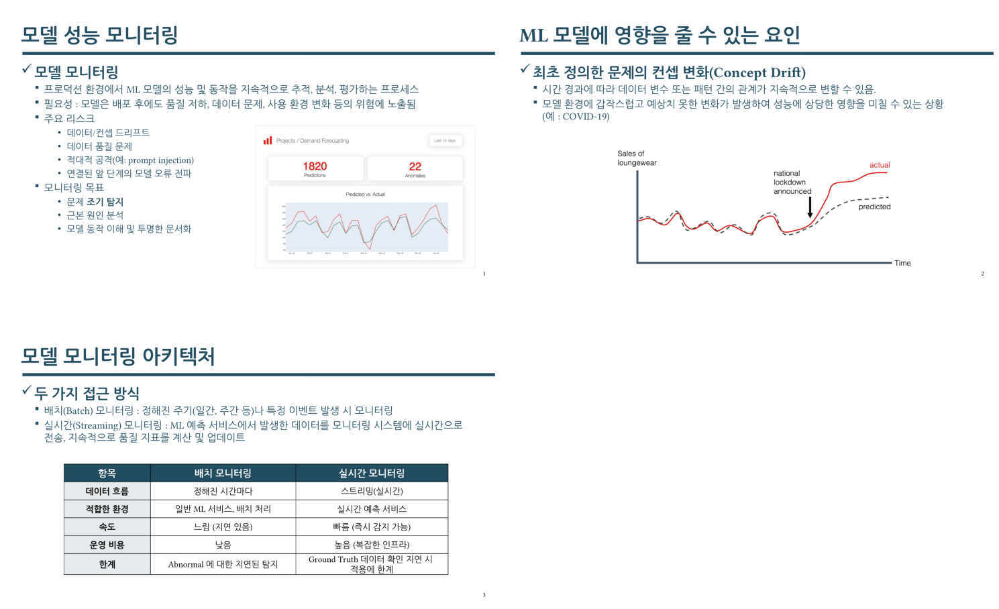

In [27]:
# 슬라이드 이미지 조회 테스트

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

n = state["n_slides"]
cols = 2
rows = (n + cols - 1) // cols

plt.figure(figsize=(15, 5 * rows))

for idx, slide in enumerate(state["slides"]):
    img_path = slide.get("snap")
    title = slide.get("title", f"Slide {idx+1}")

    plt.subplot(rows, cols, idx + 1)
    if img_path and os.path.exists(img_path):
        img = mpimg.imread(img_path)
        plt.imshow(img)
    else:
        plt.text(0.5, 0.5, f"이미지 없음\n{img_path}", ha='center', va='center')

    plt.axis('off')

plt.tight_layout()
plt.show()

### (4) 내용 생성

* 목적: 슬라이드 내용을 text로 정리
* 입력 : text, image, 표, 슬라이드 제목
* 출력 : 슬라이드 설명문
* 처리
    * 슬라이드 제목으로 SerpAPI 검색 및 요약
    * text, image, 표에 대한 설명문 생성
    * 전체 설명문 작성

#### **1) 외부 검색 노드**


In [28]:
tavily_tool= TavilySearch(max_results= 3)
def node_search(state: State) -> State:
    idx = state.get("slide_index", 0)
    slides = state.get("slides", [])
    title = ""
    if slides and idx < len(slides):
        title = slides[idx].get("title", "").strip()

    if not title:
        state["cur_search_context"] = ""
        return state

    try:
        results = tavily_tool.invoke({"query": title})
        # Tavily는 dict로 반환 → "results" 키 안에 리스트 있음
        result_list = results.get("results", [])
        snippets = [r["content"] for r in result_list if r.get("content")]
        state["cur_search_context"] = "\n\n".join(snippets[:3])
    except Exception as e:
        print(f"[검색 오류] {e}")
        state["cur_search_context"] = ""
    return state

In [29]:
# node_search 단독 테스트
test_state_search = {
    "slide_index": 0,
    "slides": [{"title": "머신러닝 지도학습", "texts": [], "tables": [], "images": [], "snap": None}],
    "prompt": {"style": "핵심 요점 중심", "tone": "친절한 톤"},
}

test_state_search = node_search(test_state_search)
print("[검색 결과 (cur_search_context)]")
print(test_state_search["cur_search_context"][:300])

[검색 결과 (cur_search_context)]
**지도 머신 러닝 또는 지도 학습은 인공 지능(AI) 애플리케이션에서 레이블이 지정된 데이터 세트를 사용하여 알고리즘을 학습하는 데 사용되는** **머신 러닝****(ML)의 한 유형입니다.** 지도 머신 러닝은 레이블이 지정된 대규모 데이터 세트를 알고리즘에 공급함으로써 알고리즘이 결과를 정확하게 예측하도록 '학습'시킵니다. 지도 머신 러닝은 데이터를 수집하고 레이블을 지정한 다음 모델을 학습시키고, 이 프로세스를 새로운 데이터 세트로 반복하는 방식으로 작동합니다. 의사 결정 트리는 분류 및 회귀 작업에 모두 사용할 수 있습니다


#### **2) 내용 생성 함수**

In [30]:
def node_generate_text(state: State) -> State:
    idx = state.get("slide_index", 0)
    slides = state.get("slides", [])

    if not slides or idx >= len(slides):
        raise IndexError(f"현재 slide_index가 잘못되었습니다: {idx}")

    cur_slide = slides[idx]

    texts = cur_slide.get("texts", [])
    tables = cur_slide.get("tables", [])
    images = list(cur_slide.get("images", []) or [])
    slide_img = cur_slide.get("snap")

    table_snip = ""
    if tables:
        try:
            table_snip = "\n".join([" | ".join(map(str, r)) for r in tables[0][:6]])
        except Exception:
            table_snip = str(tables[0][:6])

    if slide_img and slide_img not in images:
        images.insert(0, slide_img)

    prompt = state["prompt"]
    search_results = state.get("cur_search_context", "")

    sys_msg = f"""
# 역할 : 너는 발표 슬라이드의 콘텐츠를 기반으로 핵심 내용을 정리하는 전문가다.

# 지침
- 반드시 제공된 텍스트·표·이미지에 근거해 설명한다.
- 웹 검색 결과는 보조 참고자료로만 활용하고, 슬라이드 내용과 충돌하면 슬라이드를 우선한다.
- 결과는 4~6문장 분량의 자연스러운 문단으로 작성한다.
- 불릿 포인트는 사용하지 않는다.
- 스타일은 다음 지시를 따른다: {prompt.get('style')}
- 이미지가 있다면, 이미지에서 무엇이 보이는지와 그것이 텍스트/표의 내용을 보완하는지도 1~2문장 포함한다.
"""

    user_text_parts = []
    user_text_parts.append(f"[슬라이드 제목]\n{cur_slide.get('title', '')}")
    user_text_parts.append(f"[텍스트]\n{texts if texts else '(없음)'}")
    user_text_parts.append(f"[표 요약]\n{table_snip if table_snip else '(없음)'}")

    if search_results:
        user_text_parts.append(f"[웹 검색 참고자료]\n{search_results}")

    user_text = "\n\n".join(user_text_parts)

    human_msg = [{"type": "text", "text": user_text}]

    MAX_IMGS = 3
    for image in images[:MAX_IMGS]:
        try:
            data_url = img_to_data_url(image)
            human_msg.append({
                "type": "image_url",
                "image_url": {"url": data_url}
            })
        except Exception:
            pass

    response = llm.invoke([
        SystemMessage(content=sys_msg),
        HumanMessage(content=human_msg)
    ])

    state["cur_page_content"] = response.content.strip()
    return state

* 노드 테스트

In [31]:
# 검색 노드 실행
state = node_search(state)

print("[검색 결과]")
print(state.get("cur_search_content", "")[:300])

[검색 결과]



In [32]:
# 내용 생성 노드 실행
test_state = node_generate_text(state)
print("\n[생성된 cur_page_content]")
print(test_state["cur_page_content"])


[생성된 cur_page_content]
모델 성능 모니터링은 프로덕션 환경에서 머신러닝 모델의 성능과 행동을 지속적으로 추적하고 분석하는 것이 중요함을 강조한다. 모델은 배포 후에도 품질 저하 및 데이터 문제 등의 여러 위험에 노출되며, 이러한 리스크를 관리하기 위해선 데이터 드리프트와 같은 문제를 조기에 탐지하고 근본 원인을 분석하는 것이 필수적이다. 슬라이드 이미지에서는 지난 14일간 1820건의 예측과 22건의 이상 사례가 탐지된 것을 보여주며, 이는 조기 경고를 통해 문제 발생 전 대처할 수 있음을 시각적으로 전달한다. 따라서 모델 성능 모니터링은 데이터의 투명성을 확보하고 의사결정을 지원하는 데 필수적인 역할을 한다.


### (5) 강의 스크립트

* 목적 : 슬라이드 요약(page_content)을 기반으로 60~90초 분량의 발표 대본(스크립트)을 작성하고 저장
* 입력:
    * 슬라이드 설명문
    * tone, 말투 지시 프롬프트
    * 스크립트 저장 디렉토리
    * 이전 페이지의 강의 스크립트(맥락/흐름 파악용)
* 출력: 생성된 발표 스크립트

* 노드 함수 생성

In [33]:
print("=== script 직전 cur_page_content ===")
print(state.get("cur_page_content", "")[:1000])
print("===================================")

=== script 직전 cur_page_content ===
모델 성능 모니터링은 프로덕션 환경에서 머신러닝 모델의 성능과 행동을 지속적으로 추적하고 분석하는 것이 중요함을 강조한다. 모델은 배포 후에도 품질 저하 및 데이터 문제 등의 여러 위험에 노출되며, 이러한 리스크를 관리하기 위해선 데이터 드리프트와 같은 문제를 조기에 탐지하고 근본 원인을 분석하는 것이 필수적이다. 슬라이드 이미지에서는 지난 14일간 1820건의 예측과 22건의 이상 사례가 탐지된 것을 보여주며, 이는 조기 경고를 통해 문제 발생 전 대처할 수 있음을 시각적으로 전달한다. 따라서 모델 성능 모니터링은 데이터의 투명성을 확보하고 의사결정을 지원하는 데 필수적인 역할을 한다.


In [34]:
def node_generate_script(state: State) -> State:
    idx = state.get("slide_index", 0)
    page_content = state.get("cur_page_content", "").strip()
    scripts = state.get("scripts", [])
    prompt = state.get("prompt", {})

    if not page_content:
        raise ValueError(
            f"cur_page_content가 비어 있습니다. "
            f"slide_index={idx}에서 node_generate_text()가 먼저 제대로 실행됐는지 확인하세요."
        )

    prev_scripts = "\n\n".join(scripts) if scripts else "(이전 슬라이드 없음)"

    sys_msg = f"""
너는 PPT 내용을 바탕으로 자연스러운 강의 발표 대본을 작성하는 AI 강사다.

작성 규칙:
- 60~90초 분량의 발표 대본을 작성한다.
- 마크다운 기호(*, #, -, 번호 목록 등)는 사용하지 않는다.
- 실제 사람이 말하듯 자연스럽게 작성한다.
- 이전 슬라이드와 흐름이 이어지도록 작성한다.
- 현재 슬라이드 내용에서 벗어나지 않는다.
- 톤: {prompt.get('tone', '친절하고 명료한 강의 톤')}
"""

    user_msg = f"""
[현재 슬라이드 번호]
{idx + 1}

[이전 슬라이드 스크립트]
{prev_scripts}

[현재 슬라이드 내용]
{page_content}

위 내용을 바탕으로 인트로, 설명, 마무리 흐름이 자연스럽게 이어지는 발표 대본을 작성해주세요.
"""

    response = llm.invoke([
        SystemMessage(content=sys_msg),
        HumanMessage(content=user_msg)
    ])

    state["cur_script"] = response.content.strip()
    return state

* 테스트

In [35]:
state["slide_index"] = 0

state = node_generate_script(state)
print(state["cur_script"])

안녕하세요, 오늘은 머신러닝 모델의 성능 모니터링의 중요성에 대해 말씀드리겠습니다. 프로덕션 환경에서 모델은 처음 배포된 순간 이후에도 끊임없이 변화하고 있는 데이터 환경에 노출됩니다. 이러한 과정에서 모델의 성능이 저하되거나 데이터 자체에 문제가 생기는 경우가 빈번히 발생할 수 있습니다.

특히, 데이터 드리프트는 모델의 예측 정확도와 정밀도를 떨어트리는 주요 요인 중 하나인데요. 따라서, 모델 성능을 지속적으로 모니터링하여 데이터 드리프트와 같은 문제를 조기에 탐지하고 근본 원인을 분석하는 것이 무엇보다 중요합니다. 

슬라이드에 보시는 것처럼 실제 사례로 지난 14일간 1820건의 예측 중 22건의 이상 사례가 탐지되었습니다. 이는 우리가 조기 경고 시스템을 활용해 문제 발생 전에 효과적으로 대처할 수 있음을 시각적으로 잘 보여주고 있습니다.

이와 같이, 모델 성능 모니터링은 데이터의 투명성을 확보하고, 더 나아가 의사결정에 있어서 중요한 지원 역할을 한다고 할 수 있습니다. 다음으로, 이러한 모니터링을 어떻게 효과적으로 수행할 수 있을지에 대해 좀 더 구체적으로 살펴보겠습니다.


추가기능: 스크립트 반추


In [36]:
from langchain_core.prompts import ChatPromptTemplate

def evaluate_node(state: State):
    print("--- 검증 중... ---")

    script = state["cur_script"]
    context = state["cur_page_content"]
    current_retry = state.get("retry_count", 0) # 현재 횟수 가져오기

    eval_prompt = ChatPromptTemplate.from_template("""
    당신은 품질 관리 전문가입니다. 아래 내용을 바탕으로 스크립트를 평가하세요.
    [검색된 정보]: {context}
    [작성된 스크립트]: {script}

    평가 기준:
    1. 스크립트가 검색된 정보를 충분히 반영하고 있는가?
    2. 정보가 부정확하거나 거짓(Hallucination)이 섞여있지 않은가?

    반드시 답변 시작에 'PASS' 혹은 'FAIL'을 적어주세요.
    """)

    chain = eval_prompt | llm
    response = chain.invoke({"context": context, "script": script})
    result = response.content.upper()

    if "PASS" in result:
        print(" 검증 통과!")
        return {
            "is_valid": True,
            # 성공했으므로 재시도 횟수를 올리지 않음
            "retry_count": current_retry
        }
    else:
        print(f" 검증 실패: {result[:100]}...")
        # 실패해서 다시 돌아갈 것이므로 카운트 +1
        return {
            "is_valid": False,
            "retry_count": current_retry + 1
        }


In [37]:
from typing import Literal
# 조건부 함수
def decide_next_step(state: State) -> Literal["search", "end"]:
    if state["is_valid"] or state["retry_count"] >= 3:
        return "val"
    return "search"

## **3. 미션④ : 모듈 고도화2**

* 음성 변환 : 강의 목소리, 톤 조절 프롬프트 기반 음성 변환
* 영상 제작 : 각 슬라이드 강의를 전체 슬라이드 강의 영상으로 합치기
* 전체 Agent 그래프 구축
* 웹 화면 연결(gradio)



### (1) 음성 변환

* 목적 : 발표 스크립트(script)를 TTS 모델을 이용해 음성(mp3) 파일로 변환하고 state에 저장
* 입력
    * 발표 스크립트
    * 목소리 프리셋. 기본값 "alloy"
* 출력: 생성된 mp3 파일 및 경로

* 노드 함수 생성

In [38]:
def node_tts(state: State) -> State:
    """
    현재 슬라이드 대본(cur_script)을 MP3 음성 파일로 변환하는 노드입니다.
    work_dir가 state에 없으면 자동으로 기본 폴더를 만들어 사용합니다.
    """
    client = OpenAI()

    # 1) 필수 입력값 확인
    script = state.get("cur_script", "").strip()
    if not script:
        raise ValueError(
            "cur_script가 비어 있습니다. "
            "node_generate_script(state)를 먼저 실행한 뒤 node_tts(state)를 실행하세요."
        )

    # 2) voice / work_dir / slide_index 안전하게 가져오기
    voice = state.get("prompt", {}).get("voice", "alloy")
    work_dir = state.get("work_dir", "./step2_output")
    slide_index = int(state.get("slide_index", 0))

    # state에 work_dir가 없었던 경우를 위해 다시 저장
    state["work_dir"] = work_dir
    os.makedirs(work_dir, exist_ok=True)

    # 3) 슬라이드별로 다른 파일명으로 저장
    mp3_path = os.path.join(
        work_dir,
        f"slide{slide_index + 1:02d}_narration.mp3"
    )

    # 4) TTS 음성 생성
    resp = client.audio.speech.create(
        model=TTS_MODEL,
        voice=voice,
        input=script
    )

    # 5) MP3 파일 저장
    with open(mp3_path, "wb") as f:
        f.write(resp.content)

    # 6) state에 오디오 경로 저장
    state["cur_audio"] = mp3_path

    # 7) MP3 길이 확인
    duration = ffprobe_duration(mp3_path)
    print("MP3 길이:", duration, "sec")
    print("저장 경로:", mp3_path)

    return state


* 노드 테스트

In [39]:
#노드 테스트
state = node_tts(state)
print(state["cur_audio"])

MP3 길이: 73.32 sec
저장 경로: ./step2_output/slide01_narration.mp3
./step2_output/slide01_narration.mp3


In [40]:
from IPython.display import Audio, display
audio_path = state["cur_audio"]
display(Audio(filename=audio_path))
print("Audio file:", audio_path)

Audio file: ./step2_output/slide01_narration.mp3


### (2) 영상 제작
* 목적 : 슬라이드 이미지와 음성을 합쳐 mp4 영상 생성
* 입력: 오디오 파일, 이미지(스냅샷)
* 출력: 생성된 mp4 파일 및 경로

* 노드 함수 생성

In [41]:
def node_make_video(state: State) -> State:
    idx = state["slide_index"]

    s = state["slides"][idx]
    img = s["snap"]
    audio = state["cur_audio"]

    out_mp4 = os.path.join(
        state["work_dir"],
        f"slide{idx + 1:02d}_lecture.mp4"
    )

    state["cur_video"] = render_mp4(img, audio, out_mp4)

    print(f"--- [영상 생성] {idx + 1}번 슬라이드 MP4 생성 완료: {state['cur_video']} ---")

    return state

* 노드 테스트

In [42]:
state = node_make_video(state)
print(state["cur_video"])

--- [영상 생성] 1번 슬라이드 MP4 생성 완료: ./step2_output/slide01_lecture.mp4 ---
./step2_output/slide01_lecture.mp4


In [43]:
video_path = state["cur_video"]

with open(video_path, "rb") as f:
    data = f.read()

display(Video(data=data, embed=True, mimetype="video/mp4", width=1400))

### (3) 반복&종료 분기, 영상 합치기 노드
* 반복&종료 분기 : 마지막 슬라이드까지 반복 실행
* 각 슬라이드 영상을 하나의 영상으로 합치기

* State의 키(리스트)에 누적

In [44]:
def node_accumulate_result(state: State) -> State:
    """
    [누적 노드] 현재 슬라이드의 결과를 리스트에 저장하고 다음 슬라이드로 인덱스를 넘깁니다.
    """
    # 1. 재료 준비: 현재 슬라이드에서 생성된 임시 데이터들
    cur_content = state.get("cur_page_content", "")
    cur_script = state.get("cur_script", "")
    cur_audio = state.get("cur_audio", "")
    cur_video = state.get("cur_video", "")

    # 2. 요리하기: 전체 누적 리스트(Key)에 추가 (Append)
    # 리스트가 None일 경우를 대비해 get()의 기본값을 빈 리스트로 설정
    state["page_contents"].append(cur_content)
    state["scripts"].append(cur_script)
    state["audios"].append(cur_audio)
    state["videos"].append(cur_video)

    # 3. 결과 담기: 다음 슬라이드를 가리키도록 인덱스 1 증가
    state["slide_index"] += 1

    print(f"--- [누적] {state['slide_index']}번 슬라이드 완료 (총 {state['n_slides']}개) ---")

    # 4. 쟁반 넘기기
    return state

* 분기 함수

In [45]:
def should_continue(state: State):
    """
    [분기 함수] 슬라이드가 남았다면 다시 루프를 돌고, 다 끝났다면 합치기로 보냅니다.
    """
    # 우리가 검토한 slide_index < n_slides 로직 적용
    # 예: 3장일 때 index가 0->1->2까지는 계속(continue), 3이 되는 순간 종료(end)
    if state["slide_index"] < state["n_slides"]:
        print(">>> 다음 슬라이드 처리를 시작합니다.")
        return "continue"
    else:
        print(">>> 모든 슬라이드 처리가 완료되었습니다. 최종 합성을 시작합니다.")
        return "DONE"

# 그래프 구성 시 예시:
# workflow.add_conditional_edges("accumulate", should_continue, {"continue": "parse_ppt", "end": "concat_videos"})

* 영상 합치기
    * concat_videos_ffmpeg 사용

In [46]:
import os

def node_concat_videos(state: State) -> State:
    """
    [합치기 노드] 누적된 영상 리스트를 FFmpeg를 사용하여 하나로 병합합니다.
    """
    # 1. 입력 자료 준비
    video_list = state.get("videos", [])
    work_dir = state.get("work_dir", "./")

    # 영상이 없으면 바로 반환
    if not video_list:
        print("!!! 합칠 영상 파일이 없습니다.")
        return state

    # 2. 출력 경로 설정
    final_out_path = os.path.join(work_dir, "final_lecture_video.mp4")

    # 3. 처리: 제공된 concat_videos_ffmpeg 함수 호출
    try:
        print(f"--- [최종 병합] {len(video_list)}개의 영상을 합치는 중... ---")

        # 제공해주신 함수 사용 (reencode=True로 하면 호환성이 좋아지지만, False가 훨씬 빠릅니다)
        concat_videos_ffmpeg(video_list, final_out_path, reencode=False)

        # 4. 결과 저장: 최종 영상 경로를 State에 기록
        state["final_video"] = final_out_path
        print(f"--- [성공] 최종 영상이 생성되었습니다: {final_out_path} ---")

    except Exception as e:
        print(f"!!! 영상 합치기 중 에러 발생: {e}")

    return state

### (4) Agent 만들기 : 그래프로 엮기
* 다음 그래프를 참조로 하나의 에이전트로 엮어 봅시다.

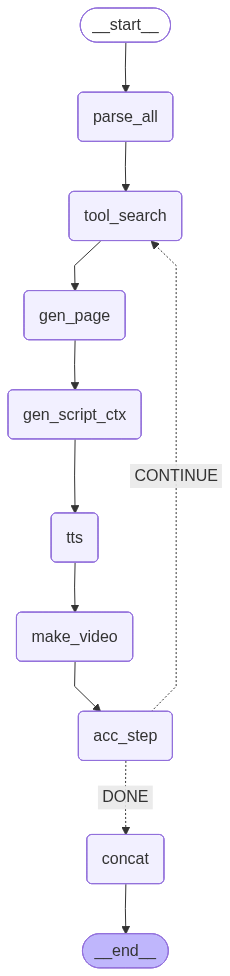

In [47]:
from langgraph.graph import StateGraph, END
builder = StateGraph(State)
builder.add_node("parse_all",      node_parse_all)
builder.add_node("tool_search",    node_search)           # 🔹 추가
builder.add_node("gen_page",       node_generate_text)
builder.add_node("gen_script_ctx", node_generate_script)
builder.add_node("evaluate_node", evaluate_node)
builder.add_node("tts",            node_tts)
builder.add_node("make_video",     node_make_video)
builder.add_node("acc_step",       node_accumulate_result)
builder.add_node("concat",         node_concat_videos)

builder.set_entry_point("parse_all")
builder.add_edge("parse_all", "tool_search")                   # 🔹 먼저 검색
builder.add_edge("tool_search", "gen_page")                    # 🔹 검색 요약 → 내용 생성
builder.add_edge("gen_page", "gen_script_ctx")
builder.add_edge("gen_script_ctx", "evaluate_node")

builder.add_conditional_edges(
    "evaluate_node",      # 시작 노드
    decide_next_step,     # 판단 함수
    {
        "search": "tool_search", # 리턴값이 search면 검색 노드로 복귀
        "val": "tts"               # 리턴값이 end면 작업 종료
    }
)

builder.add_edge("tts", "make_video")
builder.add_edge("make_video", "acc_step")
builder.add_conditional_edges("acc_step", should_continue,
                                {"continue": "tool_search", "DONE": "concat"})  # 🔹 루프 내에서도 검색 먼저
builder.add_edge("concat", END)

app = builder.compile()

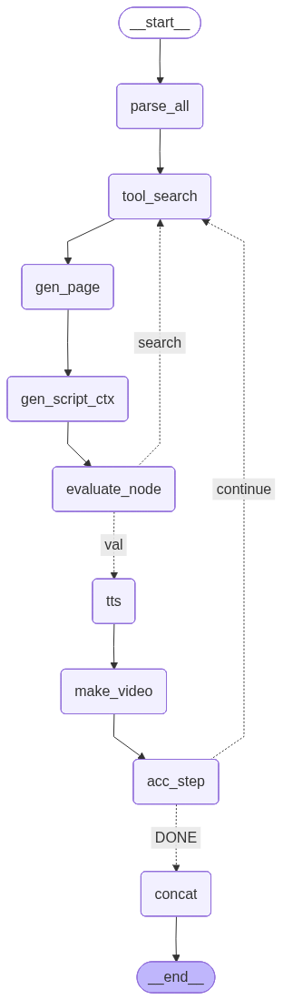

In [48]:
app

## **4. 시스템 실행**

미션3,4에서 수행한 결과를 통합 테스트 해 봅시다.

### (1) 준비 작업
* 파일 업로드
* 사용자 프롬프트 준비

In [49]:
# 파일 업로드
uploaded = files.upload()
pptx_path = list(uploaded.keys())[0]

Saving sample2.pptx to sample2 (1).pptx


In [50]:
# 사용자 프롬프트
USER_PROMPT = {
    "voice": "alloy",
    "tone": "친절하고 명료한 강의 톤",
    "style": "예시와 핵심 요점 중심"
}
# 출력 dir 만들기
WORK_DIR = "./output"
MEDIA_DIR = "./output/media"
os.makedirs(WORK_DIR, exist_ok=True)
os.makedirs(MEDIA_DIR, exist_ok=True)

### (2) Agent 실행
* State 초기화
* app 실행
* 동영상 play

In [51]:
state: State = {"pptx_path": pptx_path, "work_dir": WORK_DIR, "prompt": USER_PROMPT}
state

{'pptx_path': 'sample2 (1).pptx',
 'work_dir': './output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'}}

In [52]:
# 전체 그래프 실행
final_state = app.invoke(state)

--- 검증 중... ---
 검증 통과!
MP3 길이: 81.456 sec
저장 경로: ./output/slide01_narration.mp3
--- [영상 생성] 1번 슬라이드 MP4 생성 완료: ./output/slide01_lecture.mp4 ---
--- [누적] 1번 슬라이드 완료 (총 3개) ---
>>> 다음 슬라이드 처리를 시작합니다.
--- 검증 중... ---
 검증 통과!
MP3 길이: 82.656 sec
저장 경로: ./output/slide02_narration.mp3
--- [영상 생성] 2번 슬라이드 MP4 생성 완료: ./output/slide02_lecture.mp4 ---
--- [누적] 2번 슬라이드 완료 (총 3개) ---
>>> 다음 슬라이드 처리를 시작합니다.
--- 검증 중... ---
 검증 통과!
MP3 길이: 88.152 sec
저장 경로: ./output/slide03_narration.mp3
--- [영상 생성] 3번 슬라이드 MP4 생성 완료: ./output/slide03_lecture.mp4 ---
--- [누적] 3번 슬라이드 완료 (총 3개) ---
>>> 모든 슬라이드 처리가 완료되었습니다. 최종 합성을 시작합니다.
--- [최종 병합] 3개의 영상을 합치는 중... ---
--- [성공] 최종 영상이 생성되었습니다: ./output/final_lecture_video.mp4 ---


In [53]:
final_state

{'pptx_path': 'sample2 (1).pptx',
 'work_dir': './output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링 프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스 필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨 주요 리스크 데이터/컨셉 드리프트 데이터 품질 문제 적대적 공격(예: prompt injection) 연결된 앞 단계의 모델 오류 전파 모니터링 목표 문제 조기 탐지 근본 원인 분석 모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./output/media/slide01_img_1.png'],
   'snap': '/content/output/slide_img-1.png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift) 시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음. 모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황 (예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./output/media/slide02_img_1.png'],
   'snap': '/content/output/slide_img-2.png'},
  {'index': 3,
   'title': '모델 모니터링 아키텍처',
   'text

In [54]:
# 영상 재생
video_path = final_state.get("final_video")
print("최종 영상:", video_path)

with open(video_path, "rb") as f:
    data = f.read()
display(Video(data=data, embed=True, mimetype="video/mp4", width=960))

최종 영상: ./output/final_lecture_video.mp4


## **5. Web APP 개발(Gradio)**
* 화면 개발
    * 입력 : ppt파일, 프롬프트(강의 작성톤), voice 선택(alloy, ...)
    * 출력 : 동영상 play, 동영상 다운로드 버튼
* 기본 화면을 제공합니다. 필요한 기능을 직접 추가하세요.
    * 그래프 컴파일 이름 : `app`
    * state에서 출력 비디오 이름 : `final_video`

In [55]:
import os, time, shutil
import gradio as gr

VOICES = ["alloy", "aria", "verse", "shimmer", "coral", "sage", "nova", "amber"]

def run_pipeline_ui(pptx_file, tone, voice):

    # 작업 디렉터리 & 업로드 저장
    work_dir = os.path.join("./webio", f"run-{int(time.time())}")
    os.makedirs(work_dir, exist_ok=True)
    pptx_path = os.path.join(work_dir, "input.pptx")
    shutil.copy(pptx_file.name, pptx_path)

    # 초기 state (State 스키마에 맞춤)
    state = {
        "pptx_path": pptx_path,
        "work_dir": work_dir,
        "prompt": {
            "voice": voice or "alloy",
            "tone":  tone or "친절하고 명료한 강의 톤",
            "style": "예시와 핵심 요점 중심",
        },
    }

    # 그래프 실행
    final_state = app.invoke(state)
    video_path = final_state.get("final_video")

    return video_path, video_path

# -------------------- Gradio UI --------------------
with gr.Blocks(title="AI 강사 Agent") as demo:
    gr.Markdown("### PPT --> 강의영상 자동 제작")

    with gr.Row():
        inp_ppt = gr.File(label="PPTX 업로드", file_types=[".pptx"])
        with gr.Column():
            inp_tone  = gr.Textbox(value="친절하고 명료한 강의 톤", label="강의 작성 톤 (프롬프트)")
            inp_voice = gr.Dropdown(VOICES, value="alloy", label="TTS Voice")

    run_btn = gr.Button("실행", variant="primary")

    out_video    = gr.Video(label="최종 동영상 미리보기", interactive=False)
    out_download = gr.DownloadButton(label="동영상 다운로드")

    run_btn.click(run_pipeline_ui, [inp_ppt, inp_tone, inp_voice], [out_video, out_download])

demo.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://6ef899548c9497dcdf.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
